In [2]:
# Imports; using Python 3.11.0
import cv2
import numpy as np
import matplotlib.pyplot as plt

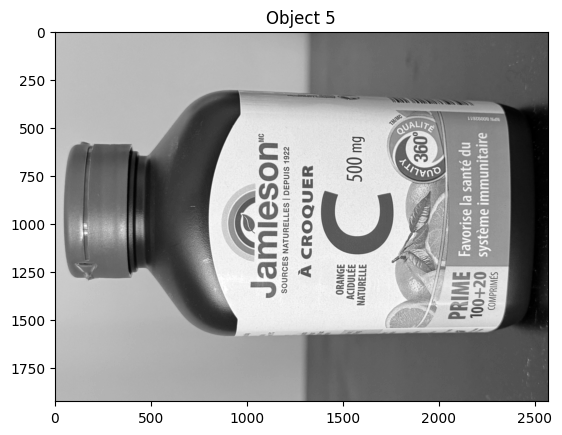

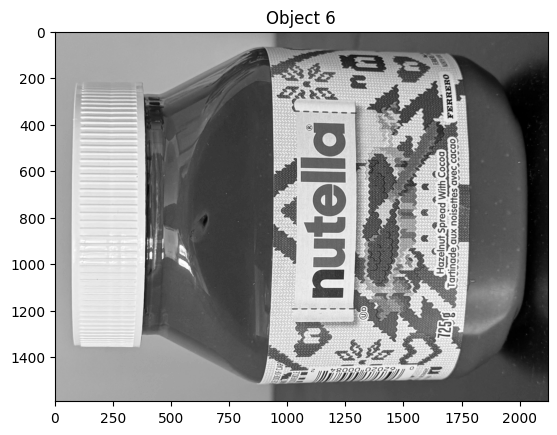

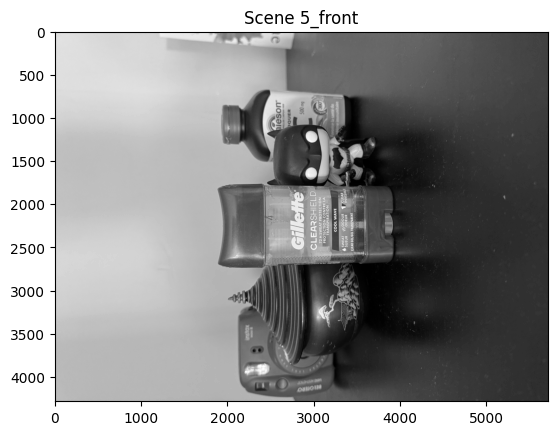

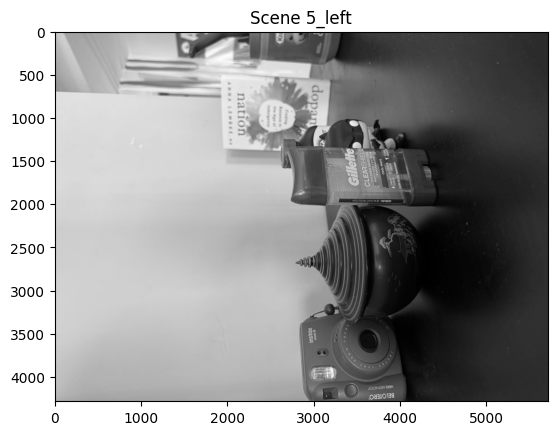

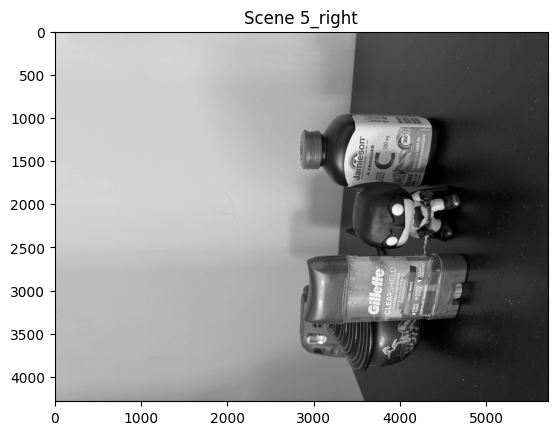

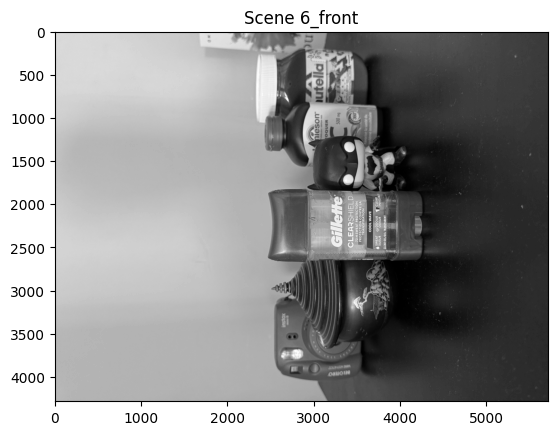

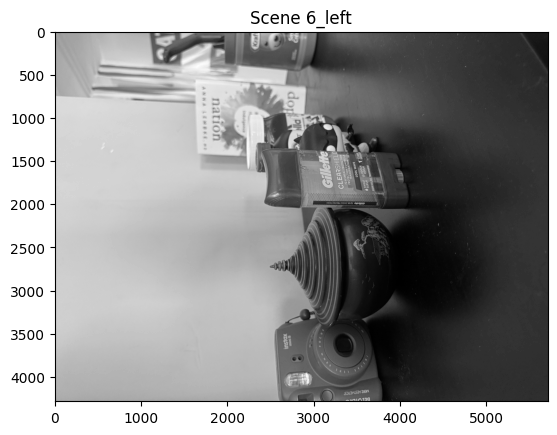

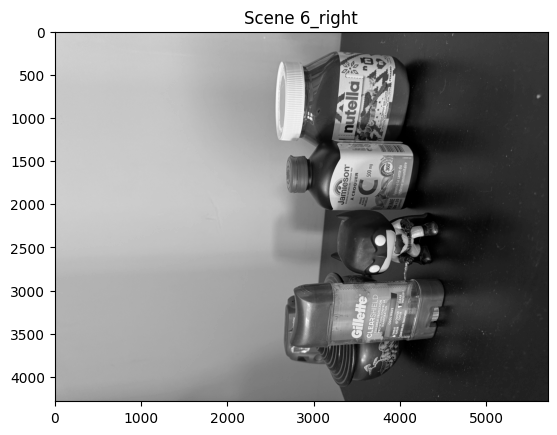

In [21]:
# Show a couple example object & scene images
for i in range(5,7):
    img = cv2.imread(f'../Objects/O{i}.jpg', cv2.IMREAD_GRAYSCALE)
    #img = cv2.resize(img, (320,240)) # maintain 4:3
    #img = cv2.equalizeHist(img) # equalize image to improve contrast
    #img = cv2.GaussianBlur(img, (3,3), 1) # blur to remove noise
    plt.imshow(img, cmap='gray')
    plt.title(f'Object {i}')
    plt.show()
for i in range(5,7):
    for j in ['front', 'left', 'right']:
        img = cv2.imread(f'../Scenes/S{i}_{j}.jpg', cv2.IMREAD_GRAYSCALE)
        plt.imshow(img, cmap='gray')
        plt.title(f'Scene {i}_{j}')
        plt.show()

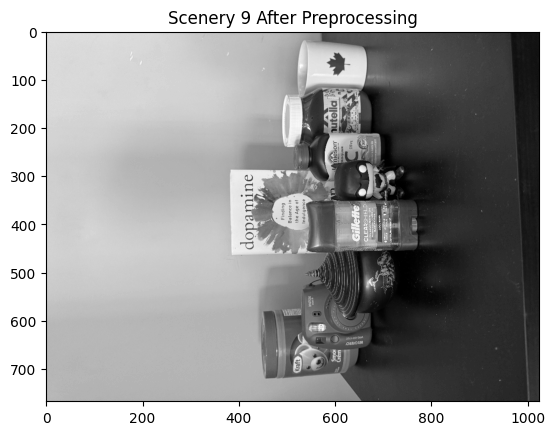

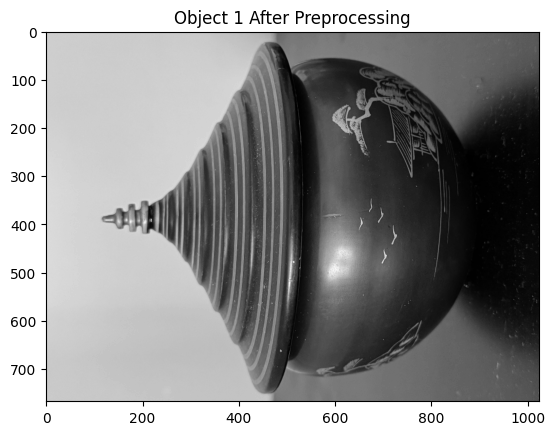

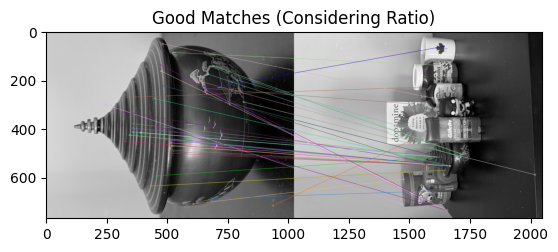

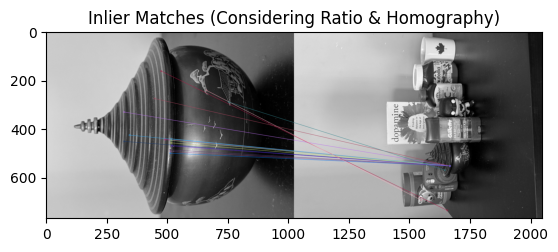

Total Keypoints: 897, Good Matches: 42, Inliers: 15, Inlier Ratio: 0.36, Match Ratio: 0.05


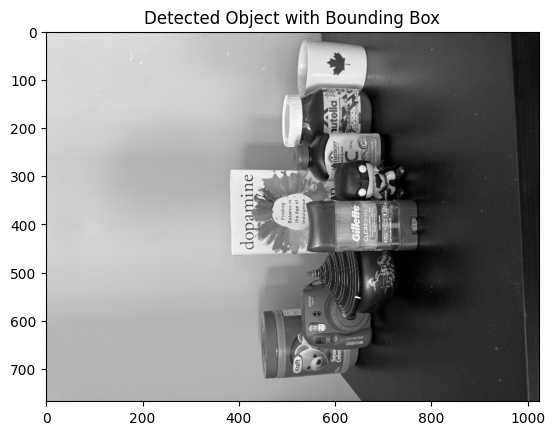

Object detected: False


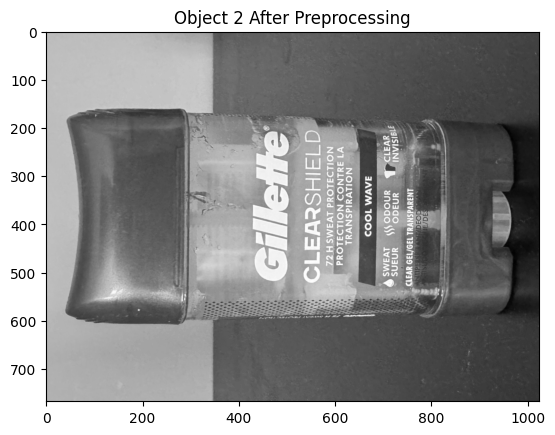

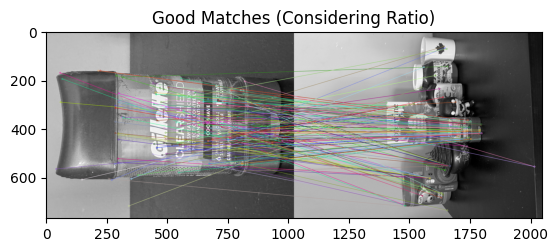

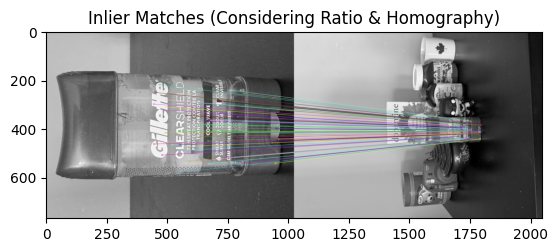

Total Keypoints: 2832, Good Matches: 154, Inliers: 60, Inlier Ratio: 0.39, Match Ratio: 0.05


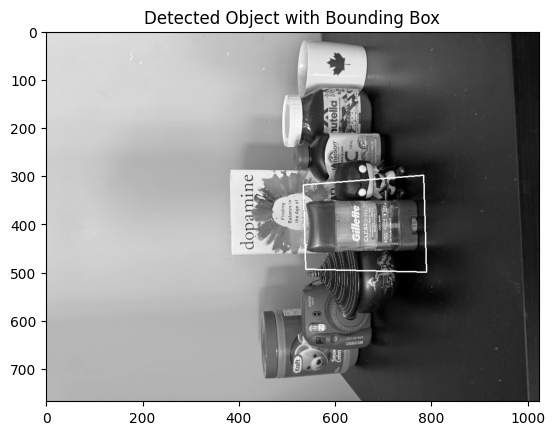

Object detected: True


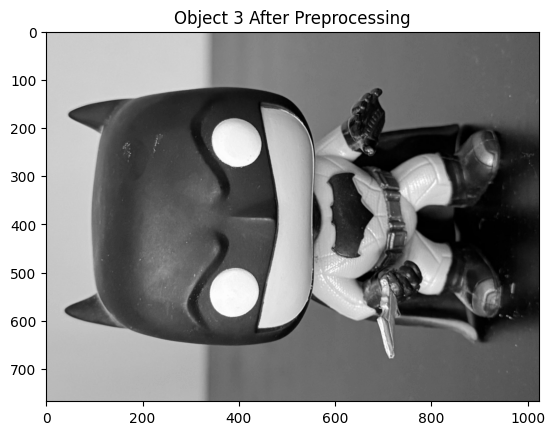

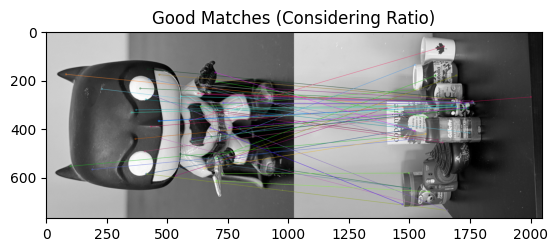

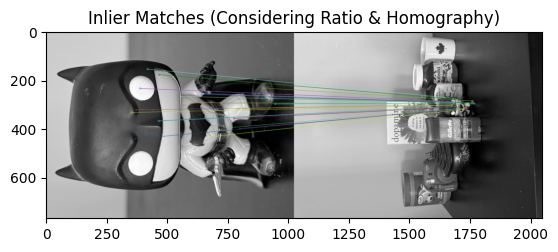

Total Keypoints: 1033, Good Matches: 57, Inliers: 24, Inlier Ratio: 0.42, Match Ratio: 0.06


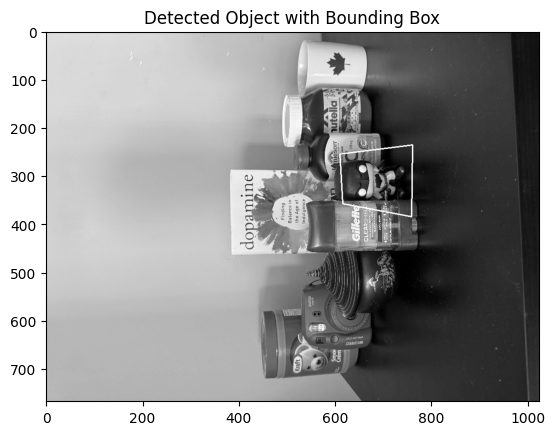

Object detected: False


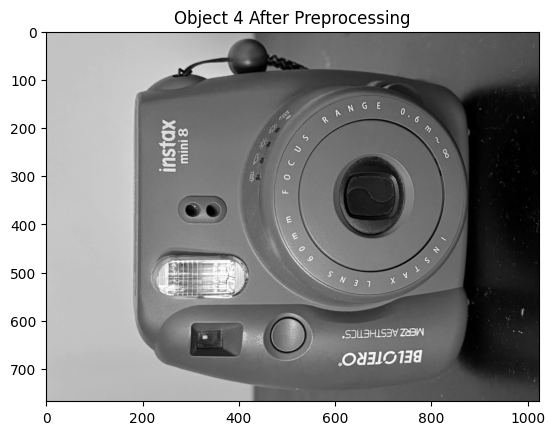

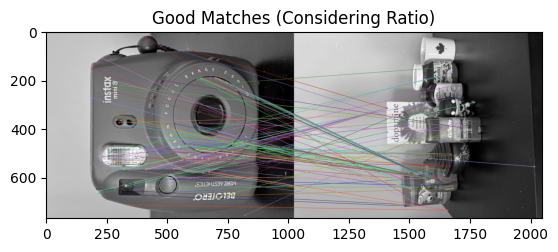

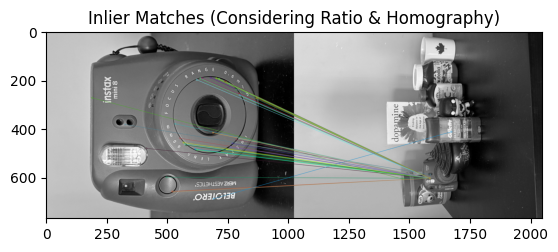

Total Keypoints: 1249, Good Matches: 104, Inliers: 36, Inlier Ratio: 0.35, Match Ratio: 0.08


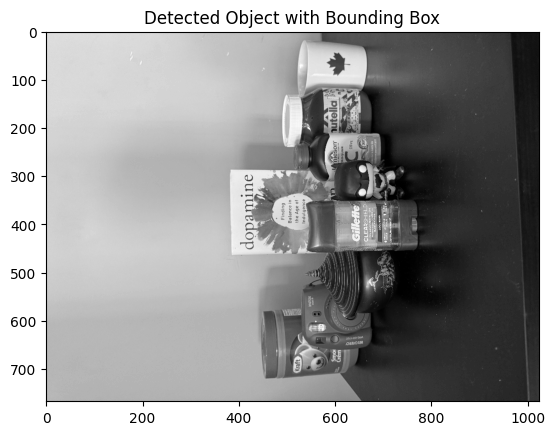

Object detected: True


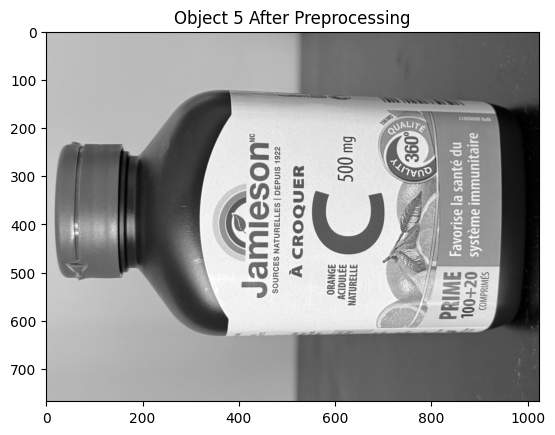

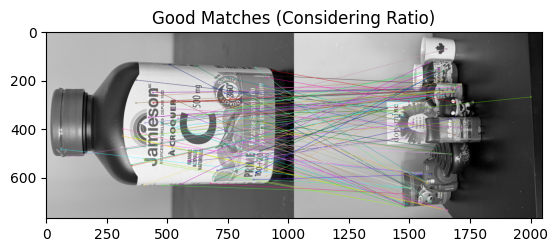

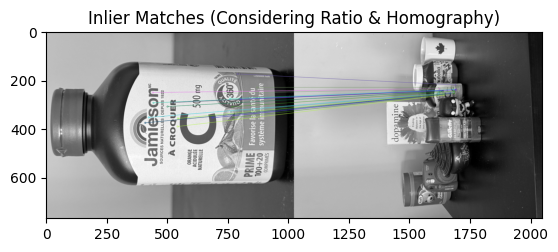

Total Keypoints: 2150, Good Matches: 113, Inliers: 23, Inlier Ratio: 0.20, Match Ratio: 0.05


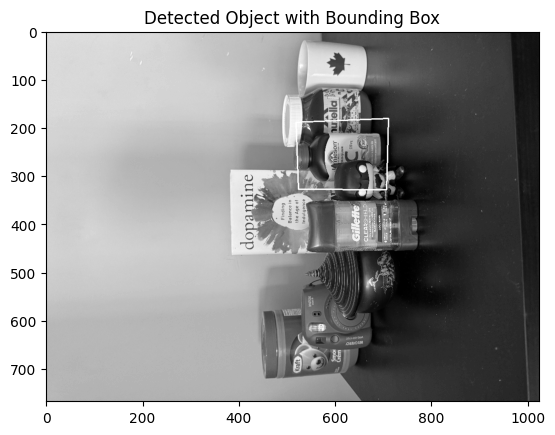

Object detected: True


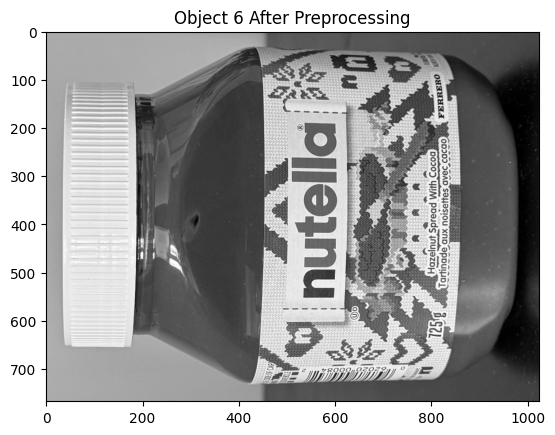

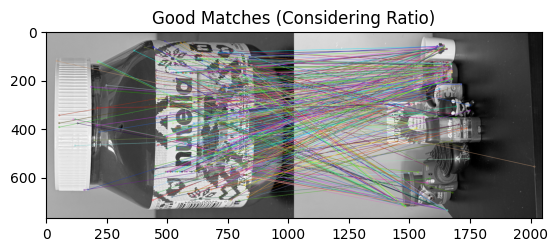

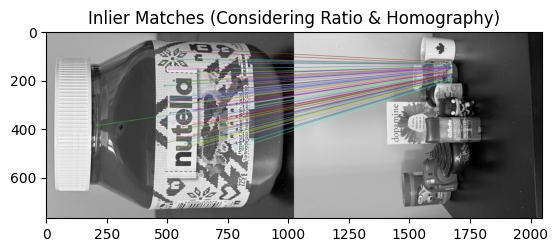

Total Keypoints: 6975, Good Matches: 376, Inliers: 89, Inlier Ratio: 0.24, Match Ratio: 0.05


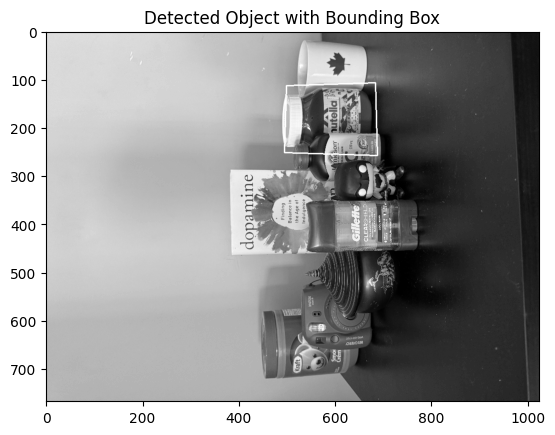

Object detected: True


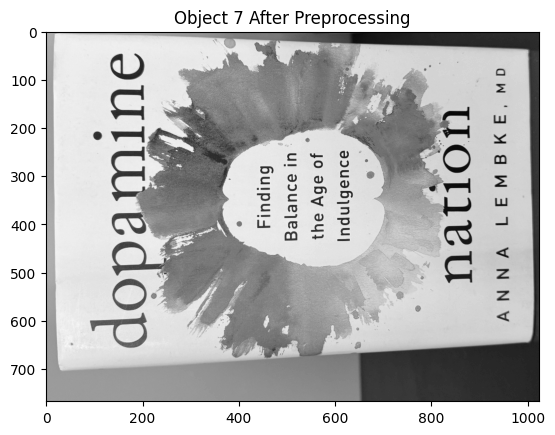

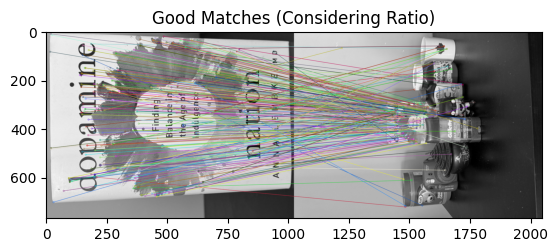

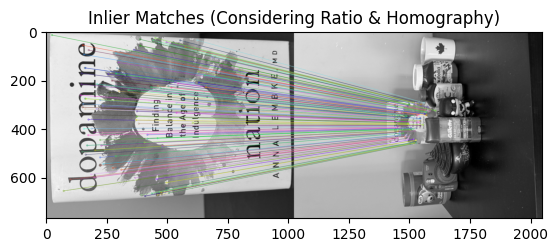

Total Keypoints: 1885, Good Matches: 270, Inliers: 145, Inlier Ratio: 0.54, Match Ratio: 0.14


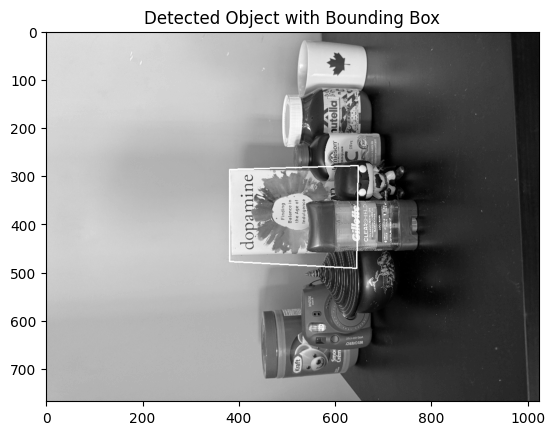

Object detected: True


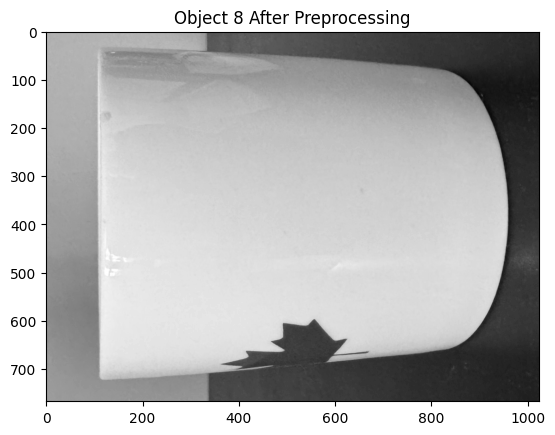

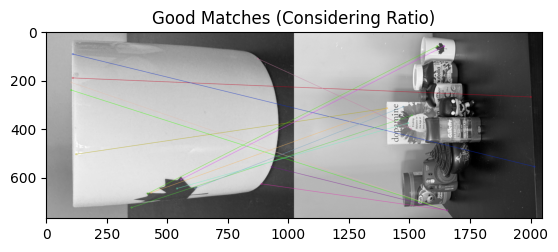

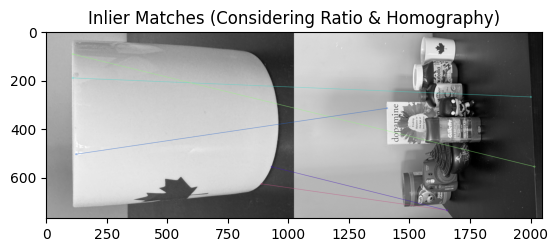

Total Keypoints: 90, Good Matches: 14, Inliers: 5, Inlier Ratio: 0.36, Match Ratio: 0.16


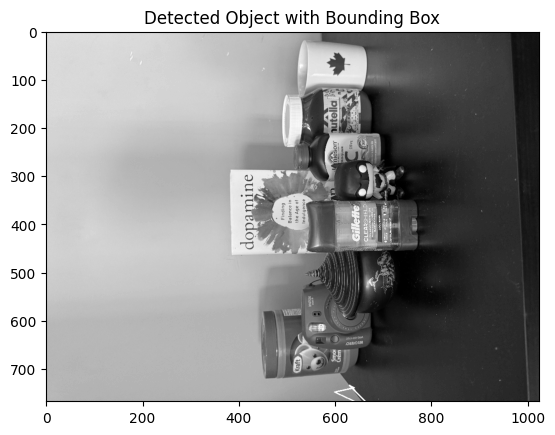

Object detected: True


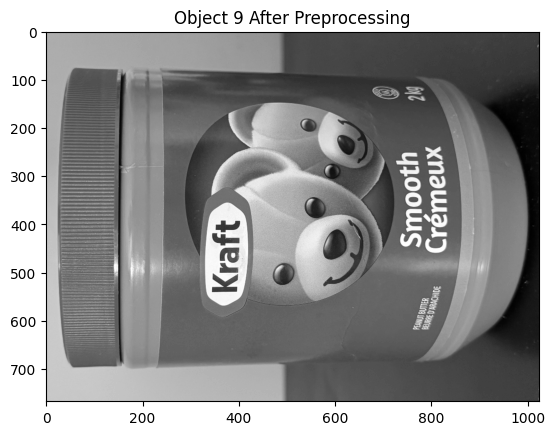

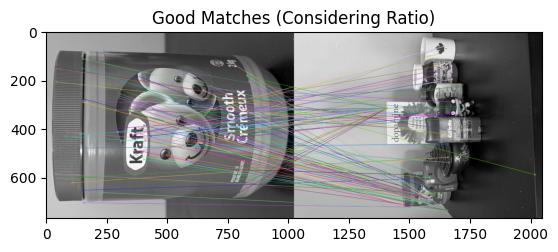

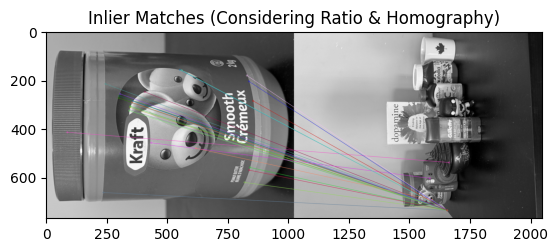

Total Keypoints: 1499, Good Matches: 116, Inliers: 24, Inlier Ratio: 0.21, Match Ratio: 0.08


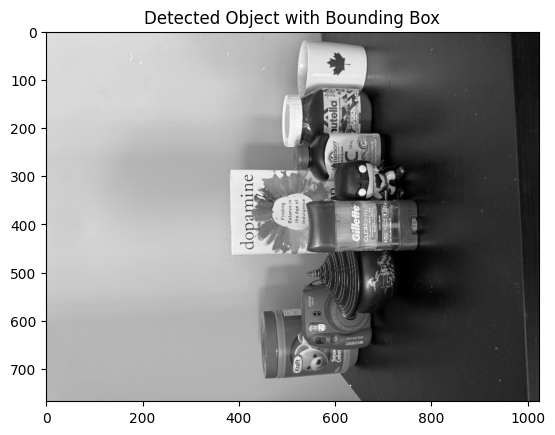

Object detected: True


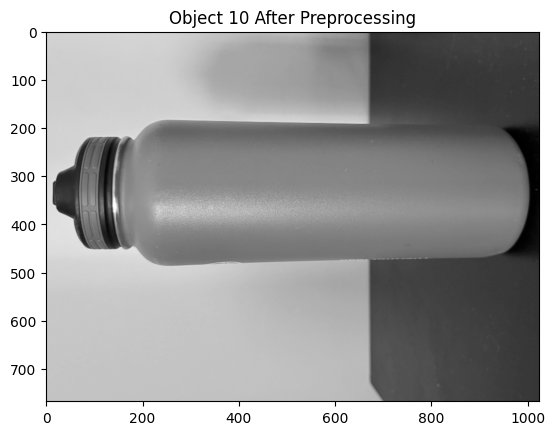

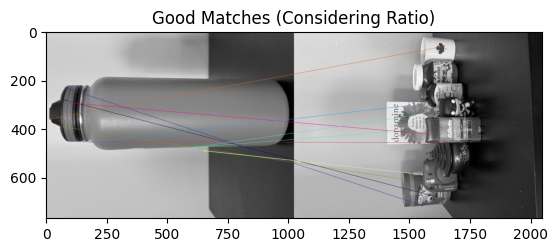

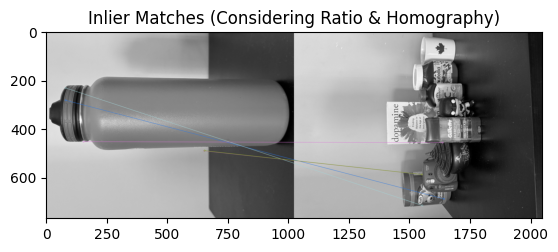

Total Keypoints: 94, Good Matches: 11, Inliers: 5, Inlier Ratio: 0.45, Match Ratio: 0.12


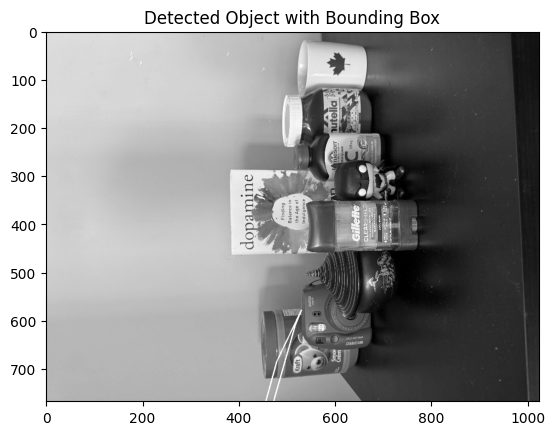

Object detected: True


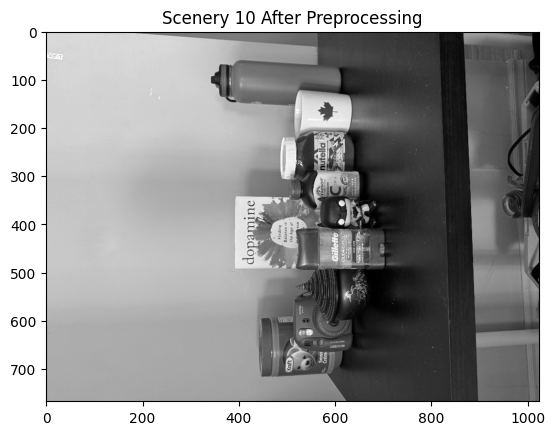

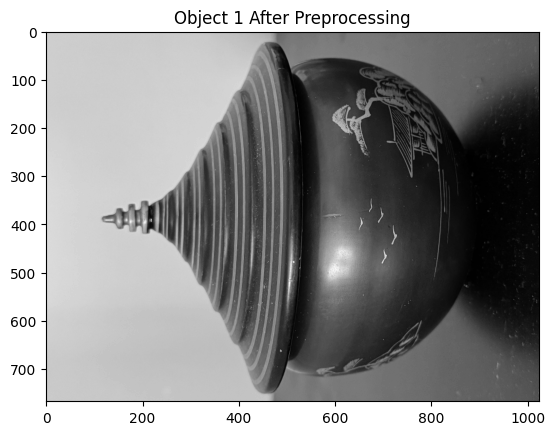

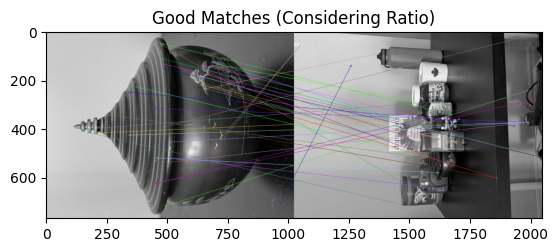

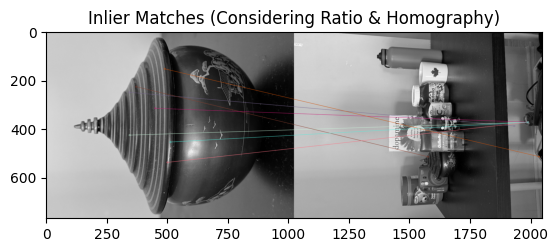

Total Keypoints: 897, Good Matches: 38, Inliers: 7, Inlier Ratio: 0.18, Match Ratio: 0.04


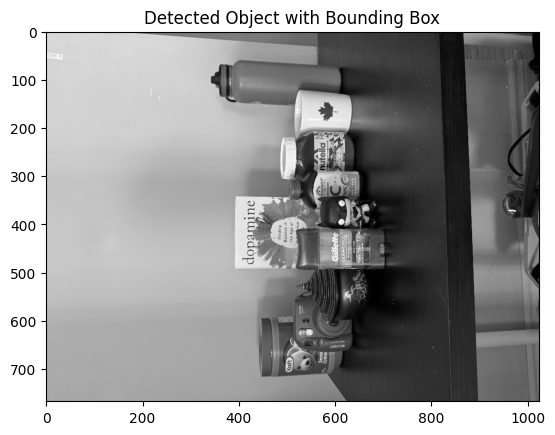

Object detected: False


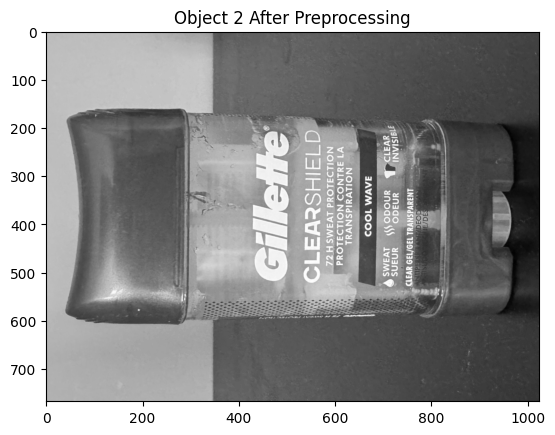

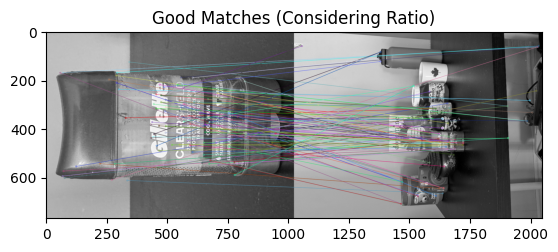

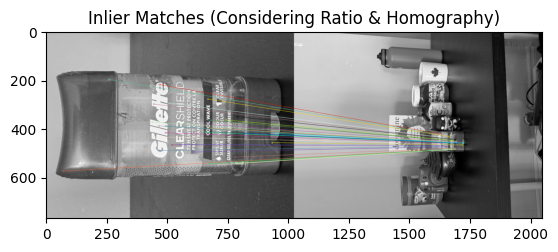

Total Keypoints: 2832, Good Matches: 108, Inliers: 32, Inlier Ratio: 0.30, Match Ratio: 0.04


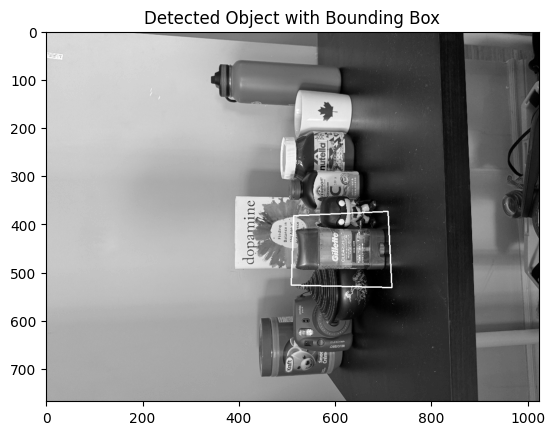

Object detected: True


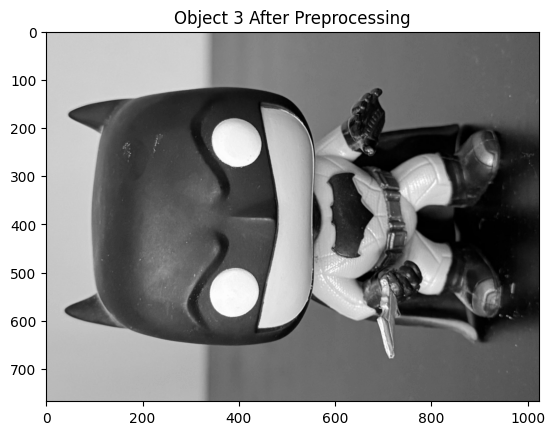

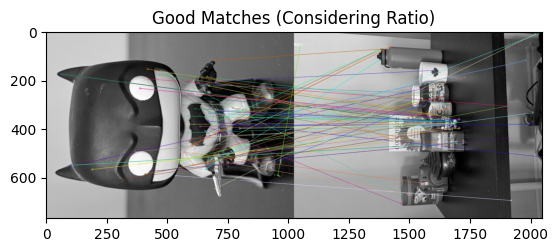

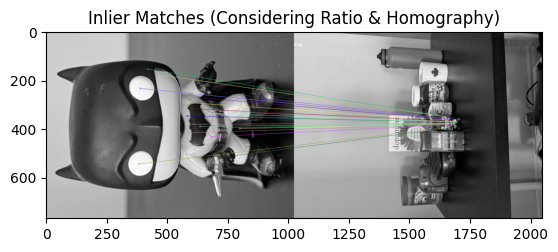

Total Keypoints: 1033, Good Matches: 71, Inliers: 21, Inlier Ratio: 0.30, Match Ratio: 0.07


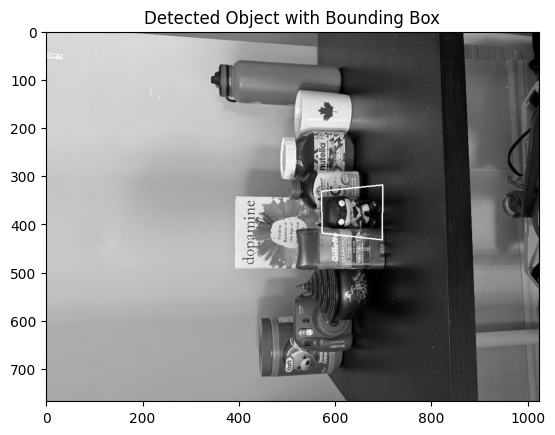

Object detected: False


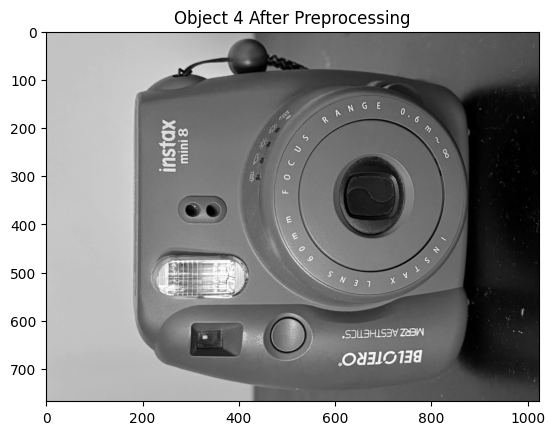

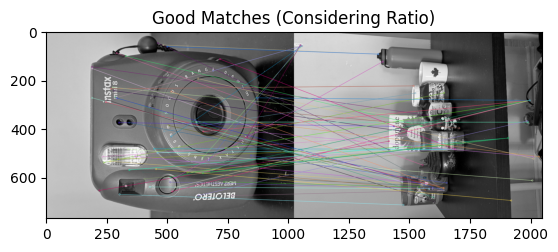

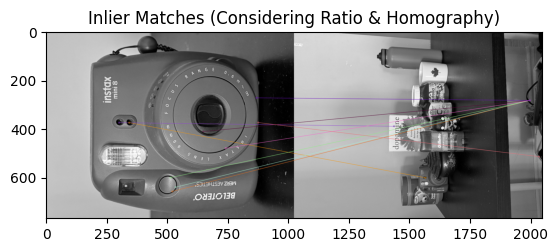

Total Keypoints: 1249, Good Matches: 67, Inliers: 9, Inlier Ratio: 0.13, Match Ratio: 0.05


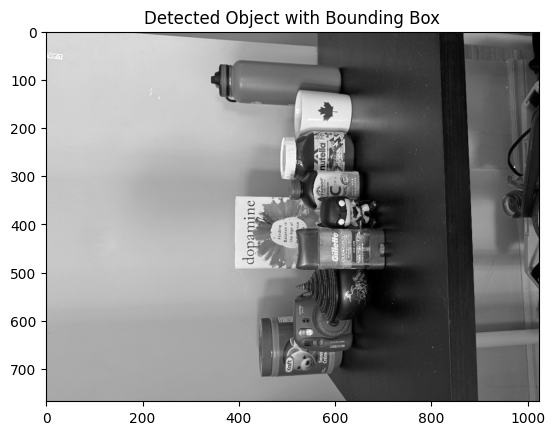

Object detected: False


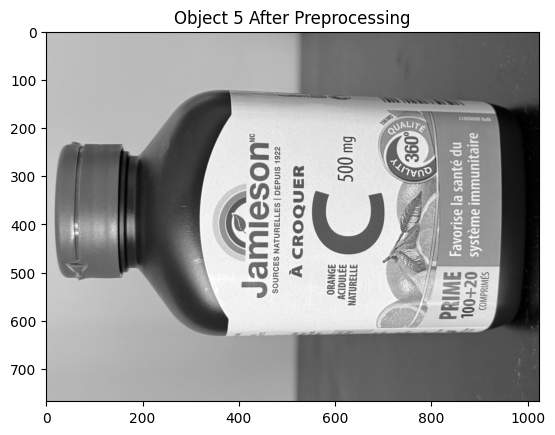

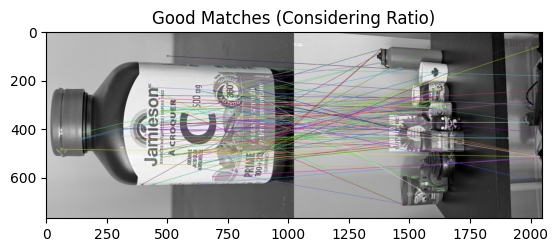

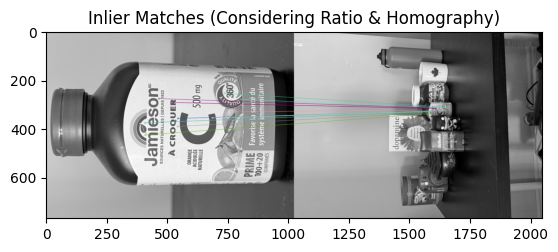

Total Keypoints: 2150, Good Matches: 121, Inliers: 14, Inlier Ratio: 0.12, Match Ratio: 0.06


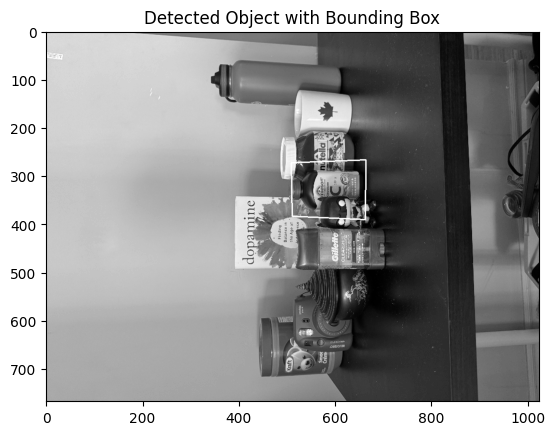

Object detected: True


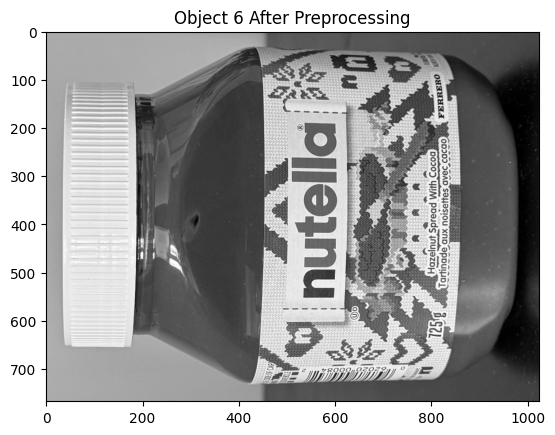

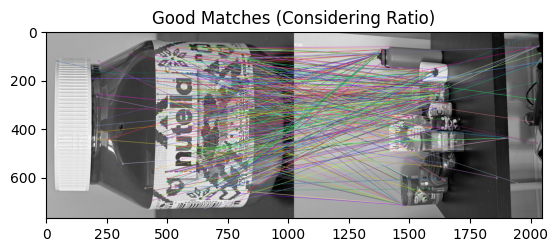

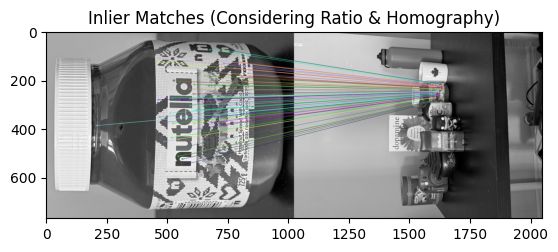

Total Keypoints: 6975, Good Matches: 362, Inliers: 68, Inlier Ratio: 0.19, Match Ratio: 0.05


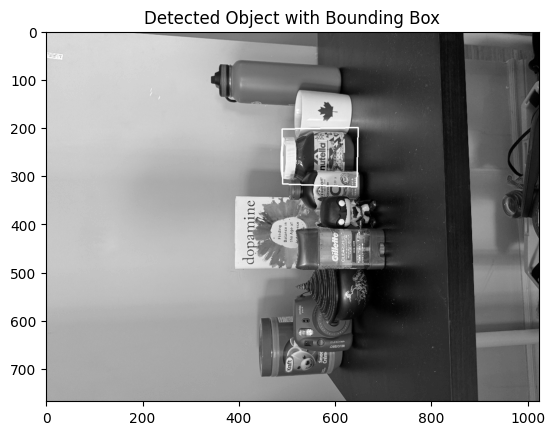

Object detected: True


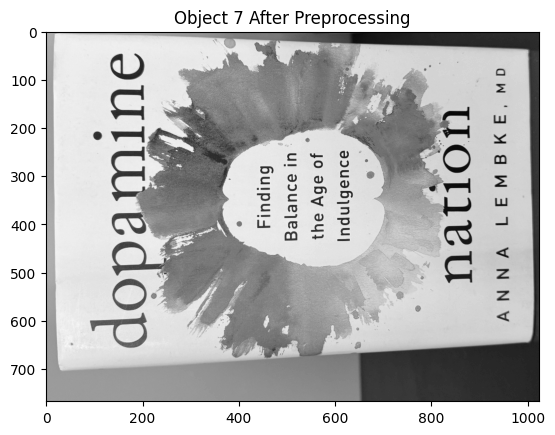

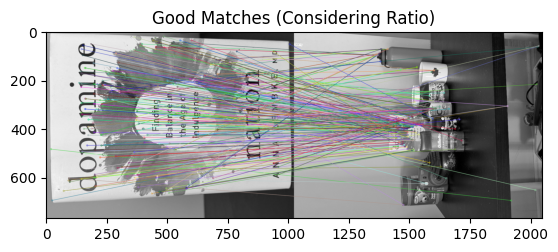

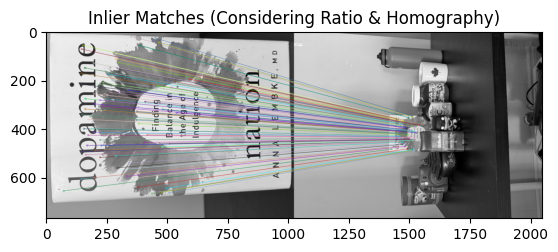

Total Keypoints: 1885, Good Matches: 276, Inliers: 111, Inlier Ratio: 0.40, Match Ratio: 0.15


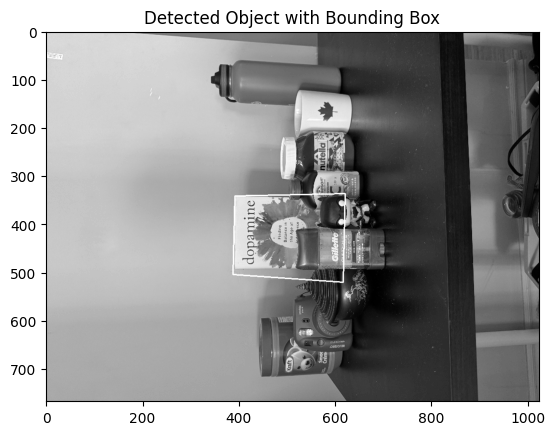

Object detected: True


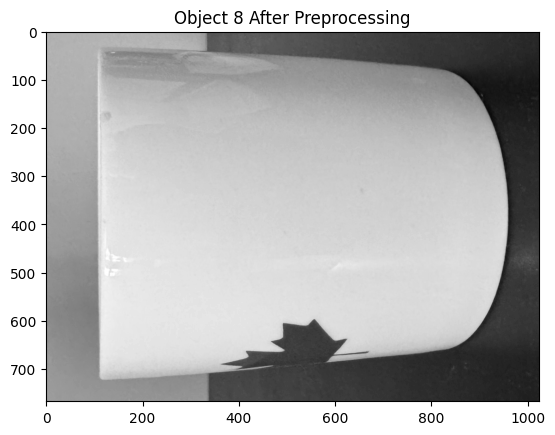

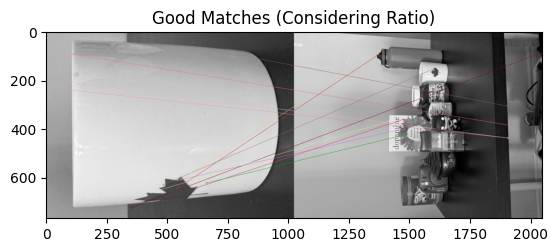

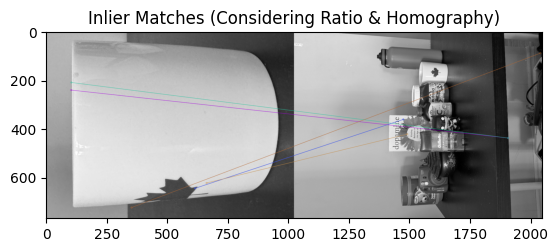

Total Keypoints: 90, Good Matches: 13, Inliers: 6, Inlier Ratio: 0.46, Match Ratio: 0.14


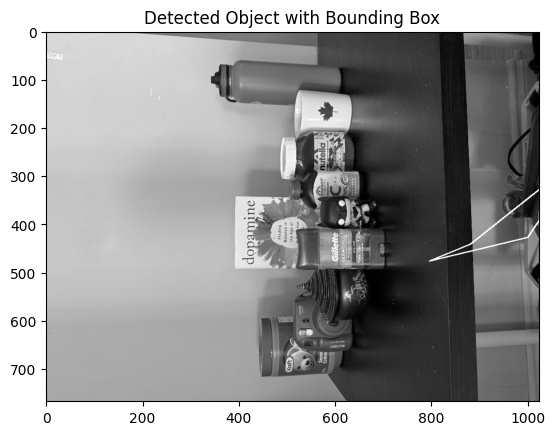

Object detected: True


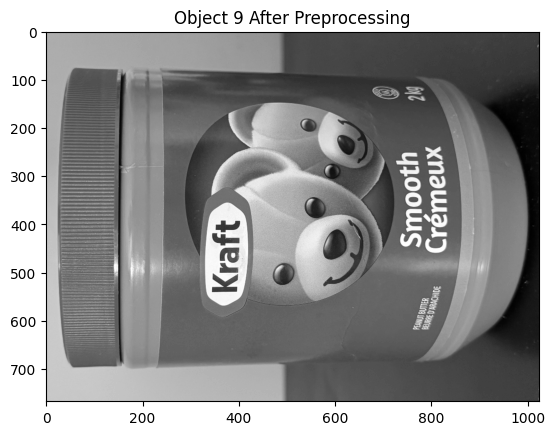

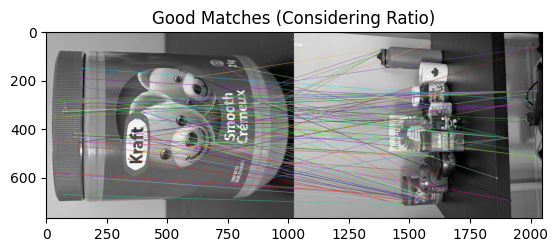

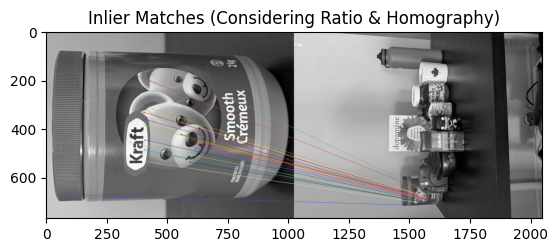

Total Keypoints: 1499, Good Matches: 113, Inliers: 22, Inlier Ratio: 0.19, Match Ratio: 0.08


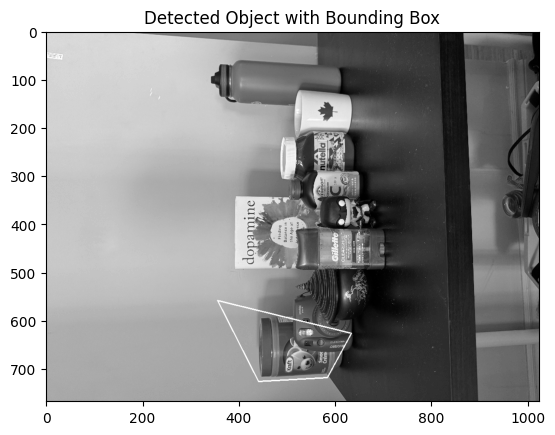

Object detected: True


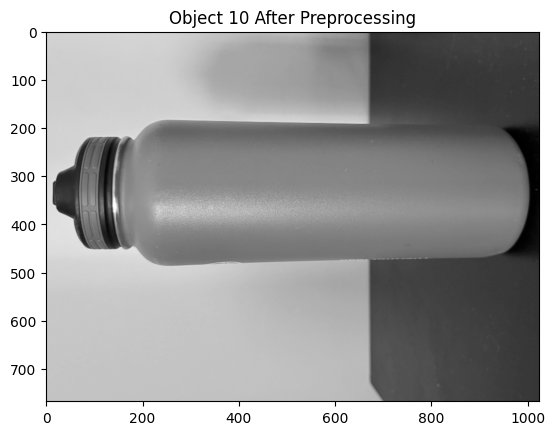

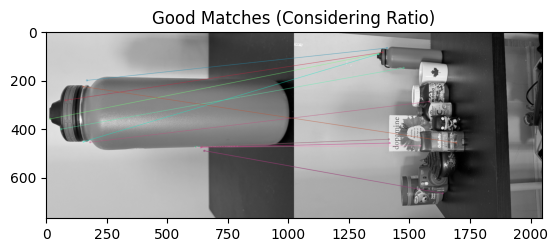

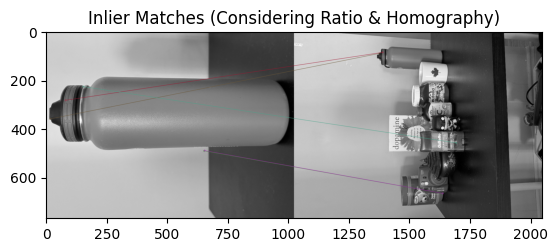

Total Keypoints: 94, Good Matches: 13, Inliers: 5, Inlier Ratio: 0.38, Match Ratio: 0.14


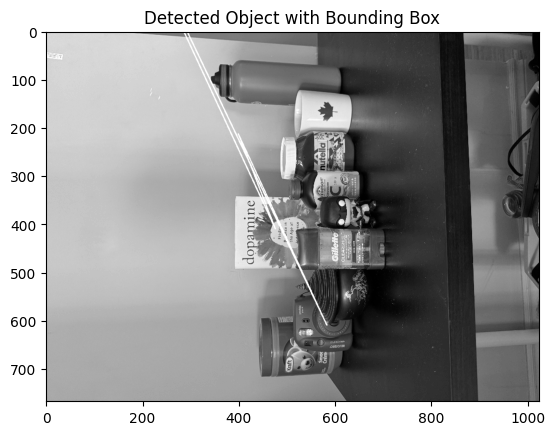

Object detected: True


In [3]:
# detect objects in each scene image

def preprocess_image(img):
    """
    resize, remove noise, and improve contrast of an object image before detecting features

    Params
    - img: numpy array representing object image

    Returns
    - img: preprocessed object image
    """
    img = cv2.resize(img, (1024, 768)) # maintain 4:3
    #img = cv2.equalizeHist(img) # equalize image to improve contrast
    #img = cv2.GaussianBlur(img, (13,13), 2) # blur to remove noise
    return img

def detect_object(O, S, threshold=0.1, ransac_threshold = 5.0):
    """
    Detects if object O is in scenery S

    Params
    O: numpy array representing object image
    S: numpy array representing scenery image
    threshold: percent of matches that should be inliers; defaults to 10%
    ransac_theshold = max distance (in terms of pixels) a point can be from homography to be an inlier; defaults to 5 pixels

    Returns
    True is object is detected, False otherwise
    """
    # extract features from each image using SIFT (SIFT is robust; it identifies key points and descriptors that are invariant to scale, rotation, etc.)
    sift = cv2.SIFT_create()
    key_pts_O, desc_O = sift.detectAndCompute(O, None) # key points = distinct regions in the image where repeatable and robust patterns exist, descriptors = vectors computed for each keypoint that describe the region around that keypoint 
    key_pts_S, desc_S = sift.detectAndCompute(S, None)

    # match descriptors using brute force matcher with default norm type for SIFT (NORM_L2 (i.e., euclidian distance))
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    matches = bf.knnMatch(desc_O, desc_S, k=2)  # for each descriptor in the object image, find the 2 closest neighbour descriptors in the scene image with the lowest euclidian distances (should we flip these?)

    # use ratio of distances to filter out ambiguous matches; if two descriptors are matched, their corresponding keypoints are considered 'matched keypoints'
    good_matches = []
    for m, n in matches:
        if m.distance/n.distance < 0.8:  # 0.8 is the threshold mentioned in the slides; if distance of best match / distance of second best match is higher than 0.8, the match is ambiguous, so we disregard it
            good_matches.append(m) 

    # visualize key points corresponding to good matches; lines represent matches, dots represent key points (the flag ensures key points that haven't been matched don't show)
    matching_result = cv2.drawMatches(O, key_pts_O, S, key_pts_S, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.imshow(matching_result, cmap='gray')
    plt.title(f'Good Matches (Considering Ratio)')
    plt.show()

    # ensure matches are also geometrically consistent by estimating a homography matrix 
    if len(good_matches) < 4:
        return False # if we currently have less than 4 good matches, that is not sufficient since a min of 4 points is needed to compute homography matrix
    coord_O = np.float32([key_pts_O[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2) # this is an array where each element represents the coordinates (x,y) of a matched keypoint from the object image
    coord_S = np.float32([key_pts_S[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    hom_matrix, inliers = cv2.findHomography(coord_O, coord_S, cv2.RANSAC, ransac_threshold) # compute homography matrix (using RANSAC) and inliers that indicate which matches fit the homography within the specified threshold (threshold = max allowed error to classify point as inlier)
    inliers = inliers.ravel().tolist() # flatten; each element is a 1 (indicating the match is an inlier) or a 0 (indicating the match is an outlier)
    num_inliers = sum(inliers)
    inlier_matches = [good_matches[i] for i in range(len(good_matches)) if inliers[i] == 1]

    # visualize key points corresponding to inlier matches from good_matches
    matching_result = cv2.drawMatches(O, key_pts_O, S, key_pts_S, inlier_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.imshow(matching_result, cmap='gray')
    plt.title(f'Inlier Matches (Considering Ratio & Homography)')
    plt.show()

    inlier_ratio = num_inliers / len(good_matches)
    match_ratio = len(good_matches) / len(key_pts_O)
    print(f"Total Keypoints: {len(key_pts_O)}, Good Matches: {len(good_matches)}, Inliers: {num_inliers}, Inlier Ratio: {inlier_ratio:.2f}, Match Ratio: {match_ratio:.2f}")

    # Draw bounding box
    h, w = O.shape
    corners_O = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2) # identify corners in the object image
    corners_S = cv2.perspectiveTransform(corners_O, hom_matrix) # apply homography matrix to map corners of object image to corresponding spots in scene image
    bounding_box = cv2.polylines(S.copy(), [np.int32(corners_S)], isClosed=True, color=(255, 255, 255), thickness=2) # draw box by connecting corners in scene image
    plt.imshow(bounding_box, cmap='gray')
    plt.title("Detected Object with Bounding Box")
    plt.show()

    return (inlier_ratio > threshold and match_ratio > 0.10) or len(good_matches) > 100 # conditions for determining if object is in scene image (still need to adjust)
    # Check if enough good matches exist in terms of the fraction of the object's keypoints that have good matches in the scene
    #match_ratio = len(good_matches) / len(key_pts_O)
    #return match_ratio > threshold
    #return len(good_matches) > 10 or match_ratio > threshold

# dict mapping each object to a name
object_names = {
    'O1': 'ornament',
    'O2': 'deodorant',
    'O3': 'batman',
    'O4': 'camera',
    'O5': 'vitamins',
    'O6': 'nutella',
    'O7': 'book',
    'O8': 'mug',
    'O9': 'peanut_butter',
    'O10': 'bottle'
}

# Open example object image and scenery
for j in range(8,10):
    S = cv2.imread(f'../Scenes/S{j+1}_front.jpg', cv2.IMREAD_GRAYSCALE)
    S = preprocess_image(S)
    plt.imshow(S, cmap='gray')
    plt.title(f'Scenery {j+1} After Preprocessing')
    plt.show()
    for i in range(0,10):
        O = cv2.imread(f'../Objects/O{i+1}.jpg', cv2.IMREAD_GRAYSCALE)
        O = preprocess_image(O)
        plt.imshow(O, cmap='gray')
        plt.title(f'Object {i+1} After Preprocessing')
        plt.show()
        detected = detect_object(O, S, 0.3, 5)
        print(f"Object detected: {detected}")